<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Parameters" data-toc-modified-id="Parameters-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Parameters</a></span></li><li><span><a href="#Data" data-toc-modified-id="Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Data</a></span></li><li><span><a href="#Generator" data-toc-modified-id="Generator-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Generator</a></span></li><li><span><a href="#Discriminator" data-toc-modified-id="Discriminator-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Discriminator</a></span></li><li><span><a href="#Loss-func" data-toc-modified-id="Loss-func-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Loss func</a></span></li><li><span><a href="#Training-Loop" data-toc-modified-id="Training-Loop-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Training Loop</a></span></li></ul></div>

In [18]:
import argparse
import os
import random

import matplotlib.animation as animation
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from IPython.display import HTML

In [19]:
random.seed(999)
torch.manual_seed(999)

# Parameters
- dataroot : root directory
- workers : no of threads for dataloader
- batch_size 
- image_size 
- nc : no of channels in input 
- nz : Size of generator input
- ngf : Size of feature maps in generator
- ndf : Size of feature maps in discriminator
- max_epochs=5
- lr : Learning rate
- beta1 : Parameter for ADAM
- ngpu : No of GPUs

In [20]:
dataroot = "retinal/"
workers = 2
batch_size = 128
image_size = 64
nc = 3
nz = 100
ngf = 64
ndf = 64
num_epochs = 3000
lr = .0002
beta1 = .5
ngpu = 1

# Data

In [21]:
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((.5, .5, .5),
                                                    (.5, .5, .5)),
                           ]))
dataloader = torch.utils.data.DataLoader(dataset,
                                         batch_size=batch_size,
                                         shuffle=True,
                                         num_workers=workers)

In [22]:
device = torch.device("cuda")

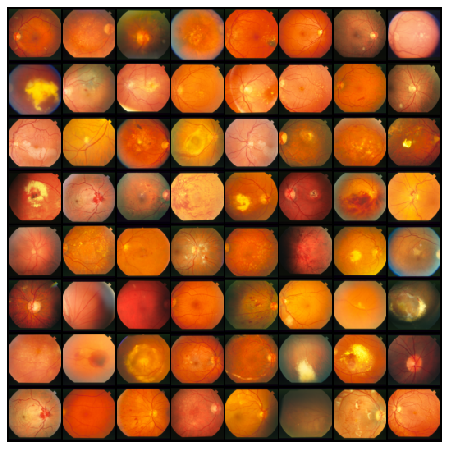

In [23]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.imshow(
    np.transpose(
        vutils.make_grid(real_batch[0].to(device)[:64],
                         padding=2,
                         normalize=True).cpu(), (1, 2,0)))

In [24]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') !=-1:
        nn.init.normal_(m.weight.data,0.0,.02)
    elif classname.find('BatchNorm') !=-1:
        nn.init.normal_(m.weight.data,1.0,.02)
        nn.init.constant_(m.bias.data,0)

# Generator

In [25]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)


In [26]:
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


# Discriminator

In [27]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [28]:
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


# Loss func

In [29]:
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=.00005, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=.0002, betas=(beta1, 0.999))


# Training Loop

In [30]:
img_list = []
G_losses = []
D_losses = []
iters = 0

In [31]:
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1


[0/3000][0/4]	Loss_D: 1.6825	Loss_G: 1.3526	D(x): 0.7541	D(G(z)): 0.6777 / 0.3235
[1/3000][0/4]	Loss_D: 3.7748	Loss_G: 0.3353	D(x): 0.8939	D(G(z)): 0.9594 / 0.7400
[2/3000][0/4]	Loss_D: 3.7651	Loss_G: 0.5074	D(x): 0.8696	D(G(z)): 0.9565 / 0.6415
[3/3000][0/4]	Loss_D: 3.3883	Loss_G: 0.9996	D(x): 0.9029	D(G(z)): 0.9380 / 0.4247
[4/3000][0/4]	Loss_D: 3.6927	Loss_G: 1.2741	D(x): 0.8996	D(G(z)): 0.9527 / 0.3328
[5/3000][0/4]	Loss_D: 3.2485	Loss_G: 2.3201	D(x): 0.8811	D(G(z)): 0.9329 / 0.1360
[6/3000][0/4]	Loss_D: 2.5539	Loss_G: 3.4073	D(x): 0.8292	D(G(z)): 0.8708 / 0.0434
[7/3000][0/4]	Loss_D: 2.2440	Loss_G: 3.9556	D(x): 0.8859	D(G(z)): 0.8379 / 0.0279
[8/3000][0/4]	Loss_D: 1.4448	Loss_G: 4.6805	D(x): 0.8385	D(G(z)): 0.6489 / 0.0134
[9/3000][0/4]	Loss_D: 0.9055	Loss_G: 4.8871	D(x): 0.8701	D(G(z)): 0.4833 / 0.0100
[10/3000][0/4]	Loss_D: 1.1254	Loss_G: 5.1554	D(x): 0.8526	D(G(z)): 0.5410 / 0.0083
[11/3000][0/4]	Loss_D: 0.8969	Loss_G: 5.3480	D(x): 0.8619	D(G(z)): 0.4407 / 0.0063
[12/3000][0/4]

[99/3000][0/4]	Loss_D: 0.6968	Loss_G: 1.5672	D(x): 0.7352	D(G(z)): 0.2895 / 0.2149
[100/3000][0/4]	Loss_D: 0.9796	Loss_G: 3.3977	D(x): 0.8648	D(G(z)): 0.5487 / 0.0356
[101/3000][0/4]	Loss_D: 0.7992	Loss_G: 2.1545	D(x): 0.7760	D(G(z)): 0.3975 / 0.1225
[102/3000][0/4]	Loss_D: 0.8578	Loss_G: 2.1790	D(x): 0.7506	D(G(z)): 0.4078 / 0.1177
[103/3000][0/4]	Loss_D: 0.7789	Loss_G: 1.4019	D(x): 0.6336	D(G(z)): 0.2108 / 0.2538
[104/3000][0/4]	Loss_D: 0.8233	Loss_G: 1.3845	D(x): 0.5770	D(G(z)): 0.1252 / 0.2554
[105/3000][0/4]	Loss_D: 0.9059	Loss_G: 1.2463	D(x): 0.5588	D(G(z)): 0.1597 / 0.2935
[106/3000][0/4]	Loss_D: 1.1237	Loss_G: 0.9440	D(x): 0.4514	D(G(z)): 0.0785 / 0.3961
[107/3000][0/4]	Loss_D: 0.6857	Loss_G: 2.5318	D(x): 0.7372	D(G(z)): 0.2629 / 0.0830
[108/3000][0/4]	Loss_D: 0.6917	Loss_G: 2.4759	D(x): 0.7764	D(G(z)): 0.3198 / 0.0918
[109/3000][0/4]	Loss_D: 0.9190	Loss_G: 2.7174	D(x): 0.7748	D(G(z)): 0.4502 / 0.0702
[110/3000][0/4]	Loss_D: 1.0424	Loss_G: 2.0282	D(x): 0.6110	D(G(z)): 0.3320 / 

[197/3000][0/4]	Loss_D: 0.6887	Loss_G: 1.8647	D(x): 0.7000	D(G(z)): 0.2593 / 0.1668
[198/3000][0/4]	Loss_D: 0.9309	Loss_G: 1.2906	D(x): 0.5827	D(G(z)): 0.2689 / 0.2921
[199/3000][0/4]	Loss_D: 1.7691	Loss_G: 0.6253	D(x): 0.2212	D(G(z)): 0.0434 / 0.5546
[200/3000][0/4]	Loss_D: 1.1028	Loss_G: 2.9563	D(x): 0.8637	D(G(z)): 0.5925 / 0.0575
[201/3000][0/4]	Loss_D: 1.1335	Loss_G: 0.6598	D(x): 0.4400	D(G(z)): 0.1872 / 0.5309
[202/3000][0/4]	Loss_D: 0.9207	Loss_G: 2.4205	D(x): 0.7309	D(G(z)): 0.4326 / 0.0985
[203/3000][0/4]	Loss_D: 0.9058	Loss_G: 1.5081	D(x): 0.6622	D(G(z)): 0.3617 / 0.2399
[204/3000][0/4]	Loss_D: 1.1967	Loss_G: 2.7808	D(x): 0.8870	D(G(z)): 0.6245 / 0.0763
[205/3000][0/4]	Loss_D: 1.0060	Loss_G: 1.0428	D(x): 0.4814	D(G(z)): 0.1832 / 0.3692
[206/3000][0/4]	Loss_D: 1.8871	Loss_G: 3.8972	D(x): 0.9533	D(G(z)): 0.8183 / 0.0236
[207/3000][0/4]	Loss_D: 1.0560	Loss_G: 1.2700	D(x): 0.5225	D(G(z)): 0.2744 / 0.3068
[208/3000][0/4]	Loss_D: 0.7774	Loss_G: 1.9827	D(x): 0.6957	D(G(z)): 0.3163 /

[295/3000][0/4]	Loss_D: 1.2711	Loss_G: 0.9076	D(x): 0.4054	D(G(z)): 0.2497 / 0.4171
[296/3000][0/4]	Loss_D: 1.1539	Loss_G: 0.8000	D(x): 0.5771	D(G(z)): 0.4207 / 0.4649
[297/3000][0/4]	Loss_D: 1.5464	Loss_G: 1.3666	D(x): 0.8180	D(G(z)): 0.7234 / 0.2673
[298/3000][0/4]	Loss_D: 1.1716	Loss_G: 1.7921	D(x): 0.8714	D(G(z)): 0.6240 / 0.1778
[299/3000][0/4]	Loss_D: 1.0746	Loss_G: 1.0416	D(x): 0.4785	D(G(z)): 0.2560 / 0.3684
[300/3000][0/4]	Loss_D: 1.2150	Loss_G: 1.4547	D(x): 0.9248	D(G(z)): 0.6591 / 0.2540
[301/3000][0/4]	Loss_D: 1.0999	Loss_G: 1.9441	D(x): 0.8881	D(G(z)): 0.6044 / 0.1589
[302/3000][0/4]	Loss_D: 1.1496	Loss_G: 1.5067	D(x): 0.7223	D(G(z)): 0.5418 / 0.2358
[303/3000][0/4]	Loss_D: 1.3123	Loss_G: 1.4967	D(x): 0.3125	D(G(z)): 0.0696 / 0.2441
[304/3000][0/4]	Loss_D: 1.1477	Loss_G: 1.4940	D(x): 0.7855	D(G(z)): 0.5790 / 0.2408
[305/3000][0/4]	Loss_D: 1.3438	Loss_G: 1.1212	D(x): 0.7141	D(G(z)): 0.6095 / 0.3484
[306/3000][0/4]	Loss_D: 1.3058	Loss_G: 1.5600	D(x): 0.6749	D(G(z)): 0.5748 /

[393/3000][0/4]	Loss_D: 1.2143	Loss_G: 0.9270	D(x): 0.6965	D(G(z)): 0.5569 / 0.4104
[394/3000][0/4]	Loss_D: 0.9794	Loss_G: 1.2979	D(x): 0.8706	D(G(z)): 0.5512 / 0.2873
[395/3000][0/4]	Loss_D: 0.7739	Loss_G: 1.9367	D(x): 0.8261	D(G(z)): 0.4311 / 0.1550
[396/3000][0/4]	Loss_D: 1.1652	Loss_G: 1.0237	D(x): 0.4698	D(G(z)): 0.3167 / 0.3746
[397/3000][0/4]	Loss_D: 1.3194	Loss_G: 0.7333	D(x): 0.6360	D(G(z)): 0.5592 / 0.4925
[398/3000][0/4]	Loss_D: 1.2738	Loss_G: 0.8940	D(x): 0.7165	D(G(z)): 0.5928 / 0.4258
[399/3000][0/4]	Loss_D: 1.4597	Loss_G: 1.0561	D(x): 0.6704	D(G(z)): 0.6371 / 0.3625
[400/3000][0/4]	Loss_D: 1.2601	Loss_G: 1.7375	D(x): 0.7962	D(G(z)): 0.6295 / 0.1867
[401/3000][0/4]	Loss_D: 1.2254	Loss_G: 1.0820	D(x): 0.6927	D(G(z)): 0.5636 / 0.3471
[402/3000][0/4]	Loss_D: 1.5398	Loss_G: 1.5595	D(x): 0.9475	D(G(z)): 0.7566 / 0.2257
[403/3000][0/4]	Loss_D: 1.0849	Loss_G: 1.3170	D(x): 0.6083	D(G(z)): 0.4269 / 0.2821
[404/3000][0/4]	Loss_D: 1.2431	Loss_G: 1.0427	D(x): 0.4684	D(G(z)): 0.3406 /

[491/3000][0/4]	Loss_D: 0.7771	Loss_G: 1.7698	D(x): 0.9122	D(G(z)): 0.4871 / 0.1805
[492/3000][0/4]	Loss_D: 0.6690	Loss_G: 1.9882	D(x): 0.9234	D(G(z)): 0.4345 / 0.1492
[493/3000][0/4]	Loss_D: 1.1386	Loss_G: 1.0163	D(x): 0.5454	D(G(z)): 0.3956 / 0.3707
[494/3000][0/4]	Loss_D: 1.3698	Loss_G: 0.6779	D(x): 0.6378	D(G(z)): 0.5870 / 0.5262
[495/3000][0/4]	Loss_D: 1.6250	Loss_G: 1.1605	D(x): 0.8605	D(G(z)): 0.7590 / 0.3362
[496/3000][0/4]	Loss_D: 1.1212	Loss_G: 1.2839	D(x): 0.6663	D(G(z)): 0.4960 / 0.2893
[497/3000][0/4]	Loss_D: 1.2338	Loss_G: 0.8977	D(x): 0.5295	D(G(z)): 0.4330 / 0.4191
[498/3000][0/4]	Loss_D: 1.1978	Loss_G: 0.8521	D(x): 0.7319	D(G(z)): 0.5767 / 0.4357
[499/3000][0/4]	Loss_D: 1.0849	Loss_G: 1.3487	D(x): 0.9360	D(G(z)): 0.6218 / 0.2749
[500/3000][0/4]	Loss_D: 0.9024	Loss_G: 1.6910	D(x): 0.9252	D(G(z)): 0.5504 / 0.1942
[501/3000][0/4]	Loss_D: 0.6815	Loss_G: 2.0147	D(x): 0.8777	D(G(z)): 0.4132 / 0.1434
[502/3000][0/4]	Loss_D: 0.9055	Loss_G: 1.9114	D(x): 0.9110	D(G(z)): 0.5410 /

[589/3000][0/4]	Loss_D: 1.1743	Loss_G: 1.2594	D(x): 0.3889	D(G(z)): 0.1829 / 0.2943
[590/3000][0/4]	Loss_D: 1.0969	Loss_G: 0.8809	D(x): 0.5971	D(G(z)): 0.4234 / 0.4330
[591/3000][0/4]	Loss_D: 1.0550	Loss_G: 0.8383	D(x): 0.6886	D(G(z)): 0.4801 / 0.4475
[592/3000][0/4]	Loss_D: 1.1016	Loss_G: 0.7695	D(x): 0.7469	D(G(z)): 0.5410 / 0.4729
[593/3000][0/4]	Loss_D: 1.1226	Loss_G: 1.0529	D(x): 0.6739	D(G(z)): 0.5011 / 0.3648
[594/3000][0/4]	Loss_D: 0.9580	Loss_G: 0.8706	D(x): 0.6545	D(G(z)): 0.3955 / 0.4318
[595/3000][0/4]	Loss_D: 1.0145	Loss_G: 0.7970	D(x): 0.7644	D(G(z)): 0.5136 / 0.4630
[596/3000][0/4]	Loss_D: 1.1288	Loss_G: 0.9591	D(x): 0.8493	D(G(z)): 0.6040 / 0.3978
[597/3000][0/4]	Loss_D: 1.1260	Loss_G: 0.6454	D(x): 0.5078	D(G(z)): 0.3454 / 0.5404
[598/3000][0/4]	Loss_D: 1.3964	Loss_G: 0.8659	D(x): 0.3323	D(G(z)): 0.2326 / 0.4309
[599/3000][0/4]	Loss_D: 0.6517	Loss_G: 1.6636	D(x): 0.9270	D(G(z)): 0.4303 / 0.1985
[600/3000][0/4]	Loss_D: 0.8932	Loss_G: 1.2903	D(x): 0.6814	D(G(z)): 0.3885 /

[687/3000][0/4]	Loss_D: 1.1478	Loss_G: 0.8078	D(x): 0.7224	D(G(z)): 0.5486 / 0.4574
[688/3000][0/4]	Loss_D: 1.2045	Loss_G: 0.8068	D(x): 0.7346	D(G(z)): 0.5763 / 0.4587
[689/3000][0/4]	Loss_D: 1.0483	Loss_G: 0.8956	D(x): 0.6037	D(G(z)): 0.4034 / 0.4190
[690/3000][0/4]	Loss_D: 1.1560	Loss_G: 0.6336	D(x): 0.5046	D(G(z)): 0.3566 / 0.5387
[691/3000][0/4]	Loss_D: 0.8523	Loss_G: 0.9586	D(x): 0.6832	D(G(z)): 0.3655 / 0.3971
[692/3000][0/4]	Loss_D: 1.0488	Loss_G: 0.7011	D(x): 0.4919	D(G(z)): 0.2638 / 0.5107
[693/3000][0/4]	Loss_D: 0.9277	Loss_G: 1.2512	D(x): 0.5918	D(G(z)): 0.3173 / 0.2986
[694/3000][0/4]	Loss_D: 0.7513	Loss_G: 1.5873	D(x): 0.9466	D(G(z)): 0.4888 / 0.2189
[695/3000][0/4]	Loss_D: 0.6703	Loss_G: 1.5734	D(x): 0.9550	D(G(z)): 0.4538 / 0.2221
[696/3000][0/4]	Loss_D: 1.2405	Loss_G: 0.8916	D(x): 0.6309	D(G(z)): 0.5290 / 0.4337
[697/3000][0/4]	Loss_D: 0.6716	Loss_G: 1.1625	D(x): 0.9529	D(G(z)): 0.4559 / 0.3253
[698/3000][0/4]	Loss_D: 0.8346	Loss_G: 1.5045	D(x): 0.9736	D(G(z)): 0.5409 /

[785/3000][0/4]	Loss_D: 1.0315	Loss_G: 1.1490	D(x): 0.7535	D(G(z)): 0.5144 / 0.3286
[786/3000][0/4]	Loss_D: 1.0515	Loss_G: 0.6381	D(x): 0.5670	D(G(z)): 0.3669 / 0.5431
[787/3000][0/4]	Loss_D: 0.6034	Loss_G: 1.7233	D(x): 0.9646	D(G(z)): 0.4260 / 0.1882
[788/3000][0/4]	Loss_D: 0.9541	Loss_G: 1.2858	D(x): 0.7770	D(G(z)): 0.4919 / 0.2940
[789/3000][0/4]	Loss_D: 0.9405	Loss_G: 0.9614	D(x): 0.7700	D(G(z)): 0.4800 / 0.3982
[790/3000][0/4]	Loss_D: 0.6599	Loss_G: 1.2575	D(x): 0.9597	D(G(z)): 0.4538 / 0.2943
[791/3000][0/4]	Loss_D: 0.6774	Loss_G: 1.8511	D(x): 0.9682	D(G(z)): 0.4630 / 0.1738
[792/3000][0/4]	Loss_D: 0.6702	Loss_G: 1.5505	D(x): 0.7984	D(G(z)): 0.3510 / 0.2228
[793/3000][0/4]	Loss_D: 0.6068	Loss_G: 1.5340	D(x): 0.9839	D(G(z)): 0.4361 / 0.2265
[794/3000][0/4]	Loss_D: 1.2776	Loss_G: 1.0231	D(x): 0.8005	D(G(z)): 0.6397 / 0.3868
[795/3000][0/4]	Loss_D: 1.0916	Loss_G: 0.8248	D(x): 0.7808	D(G(z)): 0.5577 / 0.4675
[796/3000][0/4]	Loss_D: 1.1641	Loss_G: 0.8682	D(x): 0.4687	D(G(z)): 0.3125 /

[883/3000][0/4]	Loss_D: 1.2048	Loss_G: 1.0793	D(x): 0.8730	D(G(z)): 0.6362 / 0.3558
[884/3000][0/4]	Loss_D: 0.9514	Loss_G: 0.8021	D(x): 0.6742	D(G(z)): 0.4125 / 0.4596
[885/3000][0/4]	Loss_D: 0.9814	Loss_G: 0.9037	D(x): 0.7368	D(G(z)): 0.4716 / 0.4212
[886/3000][0/4]	Loss_D: 0.8389	Loss_G: 0.8745	D(x): 0.7002	D(G(z)): 0.3668 / 0.4387
[887/3000][0/4]	Loss_D: 0.8063	Loss_G: 1.2054	D(x): 0.7379	D(G(z)): 0.3840 / 0.3156
[888/3000][0/4]	Loss_D: 0.7101	Loss_G: 1.0899	D(x): 0.8095	D(G(z)): 0.3806 / 0.3538
[889/3000][0/4]	Loss_D: 1.1568	Loss_G: 0.8897	D(x): 0.8634	D(G(z)): 0.6240 / 0.4222
[890/3000][0/4]	Loss_D: 0.8028	Loss_G: 1.3758	D(x): 0.9902	D(G(z)): 0.5380 / 0.2633
[891/3000][0/4]	Loss_D: 0.5045	Loss_G: 1.3931	D(x): 0.9786	D(G(z)): 0.3743 / 0.2704
[892/3000][0/4]	Loss_D: 1.0607	Loss_G: 1.0573	D(x): 0.6683	D(G(z)): 0.4634 / 0.3606
[893/3000][0/4]	Loss_D: 0.9228	Loss_G: 0.9596	D(x): 0.9138	D(G(z)): 0.5555 / 0.3942
[894/3000][0/4]	Loss_D: 0.4770	Loss_G: 1.3266	D(x): 0.9811	D(G(z)): 0.3617 /

[981/3000][0/4]	Loss_D: 1.1508	Loss_G: 0.9618	D(x): 0.7856	D(G(z)): 0.5830 / 0.4019
[982/3000][0/4]	Loss_D: 0.6138	Loss_G: 1.3139	D(x): 0.8738	D(G(z)): 0.3724 / 0.2841
[983/3000][0/4]	Loss_D: 0.8220	Loss_G: 1.1192	D(x): 0.9925	D(G(z)): 0.5407 / 0.3459
[984/3000][0/4]	Loss_D: 0.9541	Loss_G: 1.1613	D(x): 0.9372	D(G(z)): 0.5734 / 0.3281
[985/3000][0/4]	Loss_D: 0.2651	Loss_G: 1.9233	D(x): 0.9816	D(G(z)): 0.2148 / 0.1609
[986/3000][0/4]	Loss_D: 0.9801	Loss_G: 1.1962	D(x): 0.9594	D(G(z)): 0.5958 / 0.3206
[987/3000][0/4]	Loss_D: 0.7950	Loss_G: 1.1746	D(x): 0.9960	D(G(z)): 0.5320 / 0.3239
[988/3000][0/4]	Loss_D: 1.1267	Loss_G: 0.8958	D(x): 0.6225	D(G(z)): 0.4582 / 0.4408
[989/3000][0/4]	Loss_D: 0.5813	Loss_G: 1.3176	D(x): 0.9740	D(G(z)): 0.4145 / 0.2956
[990/3000][0/4]	Loss_D: 0.8618	Loss_G: 1.2967	D(x): 0.6273	D(G(z)): 0.3082 / 0.2900
[991/3000][0/4]	Loss_D: 0.8587	Loss_G: 1.1275	D(x): 0.9030	D(G(z)): 0.5236 / 0.3306
[992/3000][0/4]	Loss_D: 0.6456	Loss_G: 1.2369	D(x): 0.7672	D(G(z)): 0.3071 /

[1078/3000][0/4]	Loss_D: 0.7008	Loss_G: 0.9647	D(x): 0.7392	D(G(z)): 0.3154 / 0.4049
[1079/3000][0/4]	Loss_D: 0.8048	Loss_G: 1.3365	D(x): 0.9961	D(G(z)): 0.5358 / 0.2827
[1080/3000][0/4]	Loss_D: 0.8494	Loss_G: 1.1834	D(x): 0.8312	D(G(z)): 0.4742 / 0.3184
[1081/3000][0/4]	Loss_D: 0.3833	Loss_G: 1.7444	D(x): 0.9909	D(G(z)): 0.3029 / 0.1997
[1082/3000][0/4]	Loss_D: 0.6260	Loss_G: 1.7032	D(x): 0.9500	D(G(z)): 0.4273 / 0.1940
[1083/3000][0/4]	Loss_D: 0.8245	Loss_G: 1.0421	D(x): 0.5817	D(G(z)): 0.2329 / 0.3734
[1084/3000][0/4]	Loss_D: 1.1137	Loss_G: 1.3130	D(x): 0.9401	D(G(z)): 0.6326 / 0.3025
[1085/3000][0/4]	Loss_D: 0.8386	Loss_G: 1.2457	D(x): 0.7381	D(G(z)): 0.4000 / 0.3143
[1086/3000][0/4]	Loss_D: 0.7668	Loss_G: 1.2058	D(x): 0.7694	D(G(z)): 0.3814 / 0.3234
[1087/3000][0/4]	Loss_D: 0.9563	Loss_G: 1.5873	D(x): 0.4781	D(G(z)): 0.1552 / 0.2258
[1088/3000][0/4]	Loss_D: 0.9143	Loss_G: 0.9810	D(x): 0.7274	D(G(z)): 0.4304 / 0.4002
[1089/3000][0/4]	Loss_D: 0.8294	Loss_G: 0.9282	D(x): 0.7744	D(G(z

[1175/3000][0/4]	Loss_D: 0.7500	Loss_G: 1.3281	D(x): 0.9267	D(G(z)): 0.4770 / 0.2804
[1176/3000][0/4]	Loss_D: 0.9377	Loss_G: 1.3500	D(x): 0.8789	D(G(z)): 0.5406 / 0.2729
[1177/3000][0/4]	Loss_D: 0.4913	Loss_G: 1.4561	D(x): 0.8860	D(G(z)): 0.3012 / 0.2532
[1178/3000][0/4]	Loss_D: 0.6570	Loss_G: 1.4933	D(x): 0.9929	D(G(z)): 0.4554 / 0.2662
[1179/3000][0/4]	Loss_D: 0.2047	Loss_G: 2.6786	D(x): 0.9883	D(G(z)): 0.1729 / 0.0754
[1180/3000][0/4]	Loss_D: 0.5791	Loss_G: 1.6998	D(x): 0.9956	D(G(z)): 0.4257 / 0.1996
[1181/3000][0/4]	Loss_D: 1.1266	Loss_G: 1.7690	D(x): 0.7884	D(G(z)): 0.5694 / 0.2114
[1182/3000][0/4]	Loss_D: 0.7959	Loss_G: 1.4667	D(x): 0.8845	D(G(z)): 0.4779 / 0.2447
[1183/3000][0/4]	Loss_D: 0.3763	Loss_G: 1.5389	D(x): 0.9822	D(G(z)): 0.2922 / 0.2325
[1184/3000][0/4]	Loss_D: 0.4607	Loss_G: 2.0550	D(x): 0.7624	D(G(z)): 0.1645 / 0.1398
[1185/3000][0/4]	Loss_D: 0.3532	Loss_G: 1.9977	D(x): 0.9887	D(G(z)): 0.2809 / 0.1487
[1186/3000][0/4]	Loss_D: 0.9658	Loss_G: 1.2338	D(x): 0.8583	D(G(z

[1272/3000][0/4]	Loss_D: 0.3936	Loss_G: 2.3221	D(x): 0.7352	D(G(z)): 0.0765 / 0.1099
[1273/3000][0/4]	Loss_D: 0.9603	Loss_G: 1.2674	D(x): 0.8973	D(G(z)): 0.5488 / 0.2986
[1274/3000][0/4]	Loss_D: 0.5949	Loss_G: 1.6013	D(x): 0.7630	D(G(z)): 0.2646 / 0.2229
[1275/3000][0/4]	Loss_D: 0.4408	Loss_G: 2.5815	D(x): 0.9936	D(G(z)): 0.3441 / 0.0929
[1276/3000][0/4]	Loss_D: 0.6695	Loss_G: 1.4102	D(x): 0.9067	D(G(z)): 0.4197 / 0.2650
[1277/3000][0/4]	Loss_D: 0.1630	Loss_G: 2.7452	D(x): 0.9771	D(G(z)): 0.1286 / 0.0770
[1278/3000][0/4]	Loss_D: 0.7850	Loss_G: 1.3292	D(x): 0.8811	D(G(z)): 0.4706 / 0.2849
[1279/3000][0/4]	Loss_D: 0.3947	Loss_G: 2.1613	D(x): 0.7438	D(G(z)): 0.0883 / 0.1274
[1280/3000][0/4]	Loss_D: 0.6513	Loss_G: 1.6691	D(x): 0.7135	D(G(z)): 0.2581 / 0.2045
[1281/3000][0/4]	Loss_D: 1.1601	Loss_G: 0.9726	D(x): 0.6854	D(G(z)): 0.5161 / 0.4135
[1282/3000][0/4]	Loss_D: 0.6982	Loss_G: 1.3666	D(x): 0.9616	D(G(z)): 0.4639 / 0.2848
[1283/3000][0/4]	Loss_D: 0.3453	Loss_G: 1.8854	D(x): 0.9718	D(G(z

[1369/3000][0/4]	Loss_D: 0.3029	Loss_G: 2.5419	D(x): 0.8534	D(G(z)): 0.1306 / 0.0886
[1370/3000][0/4]	Loss_D: 0.6583	Loss_G: 1.4511	D(x): 0.7801	D(G(z)): 0.3246 / 0.2564
[1371/3000][0/4]	Loss_D: 0.5977	Loss_G: 1.4158	D(x): 0.9984	D(G(z)): 0.4346 / 0.2693
[1372/3000][0/4]	Loss_D: 0.4932	Loss_G: 1.6615	D(x): 0.9979	D(G(z)): 0.3718 / 0.2169
[1373/3000][0/4]	Loss_D: 0.6129	Loss_G: 1.2914	D(x): 0.8758	D(G(z)): 0.3643 / 0.3083
[1374/3000][0/4]	Loss_D: 0.3964	Loss_G: 1.4429	D(x): 0.9702	D(G(z)): 0.2998 / 0.2566
[1375/3000][0/4]	Loss_D: 0.5501	Loss_G: 1.5377	D(x): 0.7773	D(G(z)): 0.2490 / 0.2294
[1376/3000][0/4]	Loss_D: 0.3250	Loss_G: 1.6516	D(x): 0.9974	D(G(z)): 0.2685 / 0.2063
[1377/3000][0/4]	Loss_D: 0.2514	Loss_G: 2.0926	D(x): 0.9963	D(G(z)): 0.2138 / 0.1464
[1378/3000][0/4]	Loss_D: 0.2990	Loss_G: 1.9940	D(x): 0.9858	D(G(z)): 0.2373 / 0.1685
[1379/3000][0/4]	Loss_D: 0.6559	Loss_G: 1.5525	D(x): 0.8572	D(G(z)): 0.3840 / 0.2244
[1380/3000][0/4]	Loss_D: 0.0871	Loss_G: 3.3441	D(x): 0.9836	D(G(z

[1466/3000][0/4]	Loss_D: 0.3586	Loss_G: 1.7535	D(x): 0.9677	D(G(z)): 0.2708 / 0.1926
[1467/3000][0/4]	Loss_D: 0.4360	Loss_G: 1.4961	D(x): 0.9980	D(G(z)): 0.3460 / 0.2371
[1468/3000][0/4]	Loss_D: 0.6526	Loss_G: 1.4528	D(x): 0.6565	D(G(z)): 0.1874 / 0.2612
[1469/3000][0/4]	Loss_D: 0.5221	Loss_G: 1.2536	D(x): 0.8688	D(G(z)): 0.3083 / 0.3066
[1470/3000][0/4]	Loss_D: 0.5616	Loss_G: 1.3393	D(x): 0.8281	D(G(z)): 0.2942 / 0.2832
[1471/3000][0/4]	Loss_D: 0.4500	Loss_G: 1.3819	D(x): 0.9977	D(G(z)): 0.3515 / 0.2668
[1472/3000][0/4]	Loss_D: 0.6556	Loss_G: 1.4963	D(x): 0.7405	D(G(z)): 0.2878 / 0.2400
[1473/3000][0/4]	Loss_D: 0.6002	Loss_G: 1.1418	D(x): 0.8327	D(G(z)): 0.3313 / 0.3378
[1474/3000][0/4]	Loss_D: 0.1797	Loss_G: 2.4819	D(x): 0.9958	D(G(z)): 0.1591 / 0.0894
[1475/3000][0/4]	Loss_D: 0.6967	Loss_G: 1.3316	D(x): 0.8761	D(G(z)): 0.4172 / 0.2841
[1476/3000][0/4]	Loss_D: 0.3026	Loss_G: 1.7642	D(x): 0.9977	D(G(z)): 0.2517 / 0.1939
[1477/3000][0/4]	Loss_D: 0.4874	Loss_G: 1.5448	D(x): 0.8810	D(G(z

[1563/3000][0/4]	Loss_D: 0.3194	Loss_G: 2.0633	D(x): 0.9979	D(G(z)): 0.2640 / 0.1433
[1564/3000][0/4]	Loss_D: 0.6541	Loss_G: 1.1685	D(x): 0.8272	D(G(z)): 0.3525 / 0.3473
[1565/3000][0/4]	Loss_D: 0.6103	Loss_G: 1.4291	D(x): 0.9286	D(G(z)): 0.3958 / 0.2634
[1566/3000][0/4]	Loss_D: 0.1693	Loss_G: 2.0829	D(x): 0.9966	D(G(z)): 0.1502 / 0.1398
[1567/3000][0/4]	Loss_D: 0.5745	Loss_G: 1.7291	D(x): 0.9909	D(G(z)): 0.4138 / 0.2054
[1568/3000][0/4]	Loss_D: 0.5123	Loss_G: 1.5303	D(x): 0.8420	D(G(z)): 0.2754 / 0.2474
[1569/3000][0/4]	Loss_D: 0.2346	Loss_G: 1.9133	D(x): 0.9652	D(G(z)): 0.1752 / 0.1713
[1570/3000][0/4]	Loss_D: 0.3545	Loss_G: 1.7850	D(x): 0.9794	D(G(z)): 0.2766 / 0.1845
[1571/3000][0/4]	Loss_D: 0.1686	Loss_G: 3.0523	D(x): 0.9247	D(G(z)): 0.0849 / 0.0558
[1572/3000][0/4]	Loss_D: 0.4689	Loss_G: 1.8468	D(x): 0.9862	D(G(z)): 0.3538 / 0.1777
[1573/3000][0/4]	Loss_D: 0.5005	Loss_G: 1.4955	D(x): 0.9121	D(G(z)): 0.3243 / 0.2521
[1574/3000][0/4]	Loss_D: 0.1084	Loss_G: 2.7570	D(x): 0.9934	D(G(z

[1660/3000][0/4]	Loss_D: 0.1829	Loss_G: 2.5790	D(x): 0.9508	D(G(z)): 0.1205 / 0.0929
[1661/3000][0/4]	Loss_D: 0.4819	Loss_G: 1.6134	D(x): 0.9986	D(G(z)): 0.3619 / 0.2235
[1662/3000][0/4]	Loss_D: 0.1848	Loss_G: 2.6455	D(x): 0.9434	D(G(z)): 0.1166 / 0.0822
[1663/3000][0/4]	Loss_D: 0.4720	Loss_G: 1.5278	D(x): 0.9982	D(G(z)): 0.3628 / 0.2410
[1664/3000][0/4]	Loss_D: 0.2105	Loss_G: 2.3374	D(x): 0.9626	D(G(z)): 0.1543 / 0.1114
[1665/3000][0/4]	Loss_D: 0.3421	Loss_G: 2.0041	D(x): 0.9759	D(G(z)): 0.2628 / 0.1525
[1666/3000][0/4]	Loss_D: 0.4927	Loss_G: 1.2326	D(x): 0.8276	D(G(z)): 0.2522 / 0.3124
[1667/3000][0/4]	Loss_D: 0.4041	Loss_G: 1.7016	D(x): 0.8773	D(G(z)): 0.2314 / 0.2045
[1668/3000][0/4]	Loss_D: 0.0688	Loss_G: 3.6726	D(x): 0.9885	D(G(z)): 0.0553 / 0.0293
[1669/3000][0/4]	Loss_D: 0.2154	Loss_G: 3.0429	D(x): 0.9935	D(G(z)): 0.1841 / 0.0593
[1670/3000][0/4]	Loss_D: 1.0668	Loss_G: 1.6659	D(x): 0.9996	D(G(z)): 0.6271 / 0.2085
[1671/3000][0/4]	Loss_D: 0.4330	Loss_G: 2.0279	D(x): 0.9446	D(G(z

[1757/3000][0/4]	Loss_D: 0.5113	Loss_G: 1.3975	D(x): 0.9992	D(G(z)): 0.3876 / 0.2691
[1758/3000][0/4]	Loss_D: 0.4880	Loss_G: 1.5813	D(x): 0.9918	D(G(z)): 0.3644 / 0.2376
[1759/3000][0/4]	Loss_D: 0.4268	Loss_G: 1.6580	D(x): 0.8609	D(G(z)): 0.2344 / 0.2126
[1760/3000][0/4]	Loss_D: 0.1738	Loss_G: 2.1494	D(x): 0.9985	D(G(z)): 0.1546 / 0.1324
[1761/3000][0/4]	Loss_D: 0.3847	Loss_G: 2.0857	D(x): 0.9927	D(G(z)): 0.3027 / 0.1529
[1762/3000][0/4]	Loss_D: 0.5937	Loss_G: 1.3794	D(x): 0.9613	D(G(z)): 0.4005 / 0.2828
[1763/3000][0/4]	Loss_D: 0.2698	Loss_G: 1.9068	D(x): 0.9832	D(G(z)): 0.2158 / 0.1789
[1764/3000][0/4]	Loss_D: 0.3539	Loss_G: 1.9522	D(x): 0.9988	D(G(z)): 0.2819 / 0.1582
[1765/3000][0/4]	Loss_D: 0.5861	Loss_G: 1.7533	D(x): 0.9657	D(G(z)): 0.4013 / 0.2028
[1766/3000][0/4]	Loss_D: 0.3428	Loss_G: 1.5661	D(x): 0.9990	D(G(z)): 0.2793 / 0.2372
[1767/3000][0/4]	Loss_D: 0.3854	Loss_G: 2.0144	D(x): 0.8669	D(G(z)): 0.2081 / 0.1491
[1768/3000][0/4]	Loss_D: 0.2838	Loss_G: 1.9807	D(x): 0.9983	D(G(z

[1854/3000][0/4]	Loss_D: 0.4812	Loss_G: 1.6382	D(x): 0.9215	D(G(z)): 0.3079 / 0.2340
[1855/3000][0/4]	Loss_D: 0.0532	Loss_G: 4.1713	D(x): 0.9813	D(G(z)): 0.0334 / 0.0195
[1856/3000][0/4]	Loss_D: 0.3340	Loss_G: 2.6739	D(x): 0.9993	D(G(z)): 0.2739 / 0.0778
[1857/3000][0/4]	Loss_D: 0.2195	Loss_G: 2.2177	D(x): 0.9990	D(G(z)): 0.1902 / 0.1279
[1858/3000][0/4]	Loss_D: 0.3007	Loss_G: 2.0358	D(x): 0.9035	D(G(z)): 0.1744 / 0.1559
[1859/3000][0/4]	Loss_D: 0.3952	Loss_G: 1.5919	D(x): 0.9918	D(G(z)): 0.3107 / 0.2386
[1860/3000][0/4]	Loss_D: 0.3378	Loss_G: 1.6460	D(x): 0.9983	D(G(z)): 0.2769 / 0.2175
[1861/3000][0/4]	Loss_D: 0.1374	Loss_G: 3.0807	D(x): 0.9622	D(G(z)): 0.0915 / 0.0623
[1862/3000][0/4]	Loss_D: 0.1449	Loss_G: 2.7025	D(x): 0.9966	D(G(z)): 0.1289 / 0.0804
[1863/3000][0/4]	Loss_D: 0.3233	Loss_G: 1.9236	D(x): 0.9979	D(G(z)): 0.2634 / 0.1742
[1864/3000][0/4]	Loss_D: 0.5204	Loss_G: 1.4273	D(x): 0.9377	D(G(z)): 0.3520 / 0.2628
[1865/3000][0/4]	Loss_D: 0.5012	Loss_G: 2.0441	D(x): 0.6837	D(G(z

[1951/3000][0/4]	Loss_D: 0.5260	Loss_G: 1.3999	D(x): 0.9338	D(G(z)): 0.3477 / 0.2797
[1952/3000][0/4]	Loss_D: 0.6198	Loss_G: 1.3028	D(x): 0.6702	D(G(z)): 0.1775 / 0.3093
[1953/3000][0/4]	Loss_D: 0.0667	Loss_G: 3.5850	D(x): 0.9952	D(G(z)): 0.0592 / 0.0430
[1954/3000][0/4]	Loss_D: 0.9357	Loss_G: 1.7931	D(x): 0.9427	D(G(z)): 0.5631 / 0.1833
[1955/3000][0/4]	Loss_D: 0.3325	Loss_G: 1.7386	D(x): 0.9578	D(G(z)): 0.2435 / 0.2016
[1956/3000][0/4]	Loss_D: 0.1277	Loss_G: 2.5469	D(x): 0.9943	D(G(z)): 0.1124 / 0.0934
[1957/3000][0/4]	Loss_D: 0.1803	Loss_G: 2.7711	D(x): 0.9800	D(G(z)): 0.1448 / 0.0727
[1958/3000][0/4]	Loss_D: 0.1161	Loss_G: 2.7910	D(x): 0.9973	D(G(z)): 0.1055 / 0.0746
[1959/3000][0/4]	Loss_D: 0.2966	Loss_G: 2.0453	D(x): 0.9454	D(G(z)): 0.2068 / 0.1490
[1960/3000][0/4]	Loss_D: 0.2443	Loss_G: 2.2463	D(x): 0.8542	D(G(z)): 0.0786 / 0.1267
[1961/3000][0/4]	Loss_D: 0.3636	Loss_G: 1.6937	D(x): 0.9458	D(G(z)): 0.2465 / 0.2150
[1962/3000][0/4]	Loss_D: 0.2793	Loss_G: 1.8365	D(x): 0.9989	D(G(z

[2048/3000][0/4]	Loss_D: 0.4366	Loss_G: 1.5953	D(x): 0.9988	D(G(z)): 0.3287 / 0.2496
[2049/3000][0/4]	Loss_D: 0.4239	Loss_G: 1.7417	D(x): 0.9334	D(G(z)): 0.2850 / 0.2040
[2050/3000][0/4]	Loss_D: 0.9679	Loss_G: 2.0389	D(x): 0.9567	D(G(z)): 0.5716 / 0.1572
[2051/3000][0/4]	Loss_D: 1.2103	Loss_G: 1.4855	D(x): 0.9715	D(G(z)): 0.6254 / 0.2669
[2052/3000][0/4]	Loss_D: 0.1912	Loss_G: 2.1935	D(x): 0.9983	D(G(z)): 0.1652 / 0.1390
[2053/3000][0/4]	Loss_D: 0.6545	Loss_G: 1.7864	D(x): 0.9556	D(G(z)): 0.4333 / 0.1952
[2054/3000][0/4]	Loss_D: 0.2186	Loss_G: 2.0700	D(x): 0.9985	D(G(z)): 0.1870 / 0.1598
[2055/3000][0/4]	Loss_D: 0.3347	Loss_G: 1.9085	D(x): 0.9995	D(G(z)): 0.2744 / 0.1665
[2056/3000][0/4]	Loss_D: 0.1408	Loss_G: 2.7207	D(x): 0.9975	D(G(z)): 0.1248 / 0.1022
[2057/3000][0/4]	Loss_D: 0.3809	Loss_G: 2.0020	D(x): 0.9519	D(G(z)): 0.2694 / 0.1608
[2058/3000][0/4]	Loss_D: 0.2649	Loss_G: 1.8853	D(x): 0.9380	D(G(z)): 0.1773 / 0.1725
[2059/3000][0/4]	Loss_D: 0.1975	Loss_G: 2.3058	D(x): 0.9992	D(G(z

[2145/3000][0/4]	Loss_D: 0.1772	Loss_G: 2.2787	D(x): 0.9944	D(G(z)): 0.1548 / 0.1224
[2146/3000][0/4]	Loss_D: 0.1779	Loss_G: 2.7715	D(x): 0.9053	D(G(z)): 0.0730 / 0.0761
[2147/3000][0/4]	Loss_D: 0.2650	Loss_G: 1.8433	D(x): 0.9995	D(G(z)): 0.2228 / 0.1918
[2148/3000][0/4]	Loss_D: 0.2293	Loss_G: 2.1954	D(x): 0.9267	D(G(z)): 0.1384 / 0.1330
[2149/3000][0/4]	Loss_D: 0.2813	Loss_G: 2.3682	D(x): 0.8711	D(G(z)): 0.1267 / 0.1119
[2150/3000][0/4]	Loss_D: 0.3048	Loss_G: 2.0864	D(x): 0.9922	D(G(z)): 0.2403 / 0.1653
[2151/3000][0/4]	Loss_D: 0.0839	Loss_G: 3.6891	D(x): 0.9698	D(G(z)): 0.0511 / 0.0322
[2152/3000][0/4]	Loss_D: 0.4264	Loss_G: 2.2298	D(x): 0.9997	D(G(z)): 0.3337 / 0.1282
[2153/3000][0/4]	Loss_D: 0.2721	Loss_G: 2.3748	D(x): 0.9469	D(G(z)): 0.1862 / 0.1205
[2154/3000][0/4]	Loss_D: 0.3040	Loss_G: 2.6174	D(x): 0.7883	D(G(z)): 0.0562 / 0.1057
[2155/3000][0/4]	Loss_D: 0.1016	Loss_G: 2.9368	D(x): 0.9976	D(G(z)): 0.0930 / 0.0714
[2156/3000][0/4]	Loss_D: 0.2719	Loss_G: 2.6126	D(x): 0.8172	D(G(z

[2242/3000][0/4]	Loss_D: 0.1107	Loss_G: 2.9133	D(x): 0.9860	D(G(z)): 0.0902 / 0.0706
[2243/3000][0/4]	Loss_D: 0.2607	Loss_G: 2.1162	D(x): 0.9482	D(G(z)): 0.1795 / 0.1499
[2244/3000][0/4]	Loss_D: 0.0453	Loss_G: 3.7704	D(x): 0.9968	D(G(z)): 0.0408 / 0.0285
[2245/3000][0/4]	Loss_D: 0.1854	Loss_G: 2.5106	D(x): 0.9102	D(G(z)): 0.0849 / 0.1031
[2246/3000][0/4]	Loss_D: 0.2208	Loss_G: 2.2884	D(x): 0.9991	D(G(z)): 0.1914 / 0.1247
[2247/3000][0/4]	Loss_D: 0.1313	Loss_G: 2.4702	D(x): 0.9987	D(G(z)): 0.1198 / 0.1011
[2248/3000][0/4]	Loss_D: 0.3417	Loss_G: 2.2419	D(x): 0.9545	D(G(z)): 0.2423 / 0.1352
[2249/3000][0/4]	Loss_D: 0.3357	Loss_G: 1.9639	D(x): 0.8139	D(G(z)): 0.1118 / 0.1621
[2250/3000][0/4]	Loss_D: 0.0749	Loss_G: 3.5622	D(x): 0.9751	D(G(z)): 0.0481 / 0.0330
[2251/3000][0/4]	Loss_D: 0.1665	Loss_G: 2.3966	D(x): 0.9893	D(G(z)): 0.1409 / 0.1071
[2252/3000][0/4]	Loss_D: 0.1074	Loss_G: 2.9058	D(x): 0.9842	D(G(z)): 0.0860 / 0.0664
[2253/3000][0/4]	Loss_D: 0.2529	Loss_G: 2.1807	D(x): 0.9989	D(G(z

[2339/3000][0/4]	Loss_D: 0.1056	Loss_G: 2.9753	D(x): 0.9942	D(G(z)): 0.0927 / 0.0643
[2340/3000][0/4]	Loss_D: 0.1775	Loss_G: 2.4724	D(x): 0.9552	D(G(z)): 0.1195 / 0.1023
[2341/3000][0/4]	Loss_D: 0.2245	Loss_G: 2.3636	D(x): 0.8817	D(G(z)): 0.0896 / 0.1245
[2342/3000][0/4]	Loss_D: 0.1227	Loss_G: 2.4649	D(x): 0.9994	D(G(z)): 0.1125 / 0.1053
[2343/3000][0/4]	Loss_D: 0.3191	Loss_G: 2.5202	D(x): 0.8390	D(G(z)): 0.1248 / 0.1022
[2344/3000][0/4]	Loss_D: 0.1345	Loss_G: 2.8790	D(x): 0.9598	D(G(z)): 0.0875 / 0.0719
[2345/3000][0/4]	Loss_D: 0.0633	Loss_G: 3.2081	D(x): 0.9992	D(G(z)): 0.0597 / 0.0562
[2346/3000][0/4]	Loss_D: 0.0863	Loss_G: 3.0636	D(x): 0.9996	D(G(z)): 0.0810 / 0.0590
[2347/3000][0/4]	Loss_D: 0.3058	Loss_G: 1.9235	D(x): 0.9988	D(G(z)): 0.2463 / 0.1850
[2348/3000][0/4]	Loss_D: 0.3328	Loss_G: 2.1298	D(x): 0.7790	D(G(z)): 0.0688 / 0.1435
[2349/3000][0/4]	Loss_D: 0.0408	Loss_G: 4.2605	D(x): 0.9907	D(G(z)): 0.0307 / 0.0177
[2350/3000][0/4]	Loss_D: 0.2394	Loss_G: 2.1110	D(x): 0.9809	D(G(z

[2436/3000][0/4]	Loss_D: 0.1663	Loss_G: 2.3207	D(x): 0.9936	D(G(z)): 0.1424 / 0.1277
[2437/3000][0/4]	Loss_D: 0.1996	Loss_G: 2.7747	D(x): 0.9136	D(G(z)): 0.0991 / 0.0778
[2438/3000][0/4]	Loss_D: 0.0922	Loss_G: 3.4382	D(x): 0.9899	D(G(z)): 0.0706 / 0.0420
[2439/3000][0/4]	Loss_D: 0.1969	Loss_G: 2.1371	D(x): 0.9753	D(G(z)): 0.1512 / 0.1452
[2440/3000][0/4]	Loss_D: 0.2369	Loss_G: 2.0955	D(x): 0.9997	D(G(z)): 0.1999 / 0.1617
[2441/3000][0/4]	Loss_D: 0.3172	Loss_G: 2.9691	D(x): 0.7674	D(G(z)): 0.0335 / 0.0720
[2442/3000][0/4]	Loss_D: 0.2783	Loss_G: 2.3259	D(x): 0.9996	D(G(z)): 0.2216 / 0.1275
[2443/3000][0/4]	Loss_D: 0.1957	Loss_G: 2.6428	D(x): 0.9996	D(G(z)): 0.1693 / 0.1153
[2444/3000][0/4]	Loss_D: 0.2212	Loss_G: 2.0825	D(x): 0.9996	D(G(z)): 0.1923 / 0.1477
[2445/3000][0/4]	Loss_D: 0.4950	Loss_G: 2.9991	D(x): 0.6416	D(G(z)): 0.0249 / 0.0657
[2446/3000][0/4]	Loss_D: 0.1873	Loss_G: 2.6885	D(x): 0.9229	D(G(z)): 0.0987 / 0.0883
[2447/3000][0/4]	Loss_D: 0.4475	Loss_G: 1.9226	D(x): 0.9741	D(G(z

[2533/3000][0/4]	Loss_D: 0.5460	Loss_G: 1.6860	D(x): 0.9825	D(G(z)): 0.3677 / 0.2199
[2534/3000][0/4]	Loss_D: 0.4121	Loss_G: 2.2490	D(x): 0.9969	D(G(z)): 0.3176 / 0.1358
[2535/3000][0/4]	Loss_D: 0.2526	Loss_G: 2.6224	D(x): 0.8837	D(G(z)): 0.1153 / 0.0896
[2536/3000][0/4]	Loss_D: 0.2445	Loss_G: 3.0676	D(x): 0.8256	D(G(z)): 0.0430 / 0.0598
[2537/3000][0/4]	Loss_D: 0.3797	Loss_G: 1.9416	D(x): 0.9997	D(G(z)): 0.2957 / 0.1847
[2538/3000][0/4]	Loss_D: 0.2657	Loss_G: 2.6989	D(x): 0.8249	D(G(z)): 0.0616 / 0.0851
[2539/3000][0/4]	Loss_D: 0.5341	Loss_G: 1.8606	D(x): 0.9940	D(G(z)): 0.3765 / 0.1932
[2540/3000][0/4]	Loss_D: 0.2666	Loss_G: 2.1757	D(x): 0.9982	D(G(z)): 0.2199 / 0.1472
[2541/3000][0/4]	Loss_D: 0.1507	Loss_G: 2.5540	D(x): 0.9994	D(G(z)): 0.1348 / 0.0963
[2542/3000][0/4]	Loss_D: 0.0573	Loss_G: 3.5417	D(x): 0.9937	D(G(z)): 0.0491 / 0.0355
[2543/3000][0/4]	Loss_D: 0.7570	Loss_G: 1.7792	D(x): 0.9910	D(G(z)): 0.4971 / 0.1960
[2544/3000][0/4]	Loss_D: 0.1920	Loss_G: 2.1451	D(x): 0.9985	D(G(z

[2630/3000][0/4]	Loss_D: 0.0444	Loss_G: 3.6462	D(x): 0.9990	D(G(z)): 0.0420 / 0.0380
[2631/3000][0/4]	Loss_D: 0.0741	Loss_G: 3.3948	D(x): 0.9949	D(G(z)): 0.0657 / 0.0416
[2632/3000][0/4]	Loss_D: 0.0422	Loss_G: 3.5833	D(x): 0.9986	D(G(z)): 0.0396 / 0.0372
[2633/3000][0/4]	Loss_D: 0.0594	Loss_G: 3.3742	D(x): 0.9989	D(G(z)): 0.0560 / 0.0440
[2634/3000][0/4]	Loss_D: 0.2898	Loss_G: 1.9715	D(x): 0.9902	D(G(z)): 0.2269 / 0.1845
[2635/3000][0/4]	Loss_D: 0.1336	Loss_G: 2.6690	D(x): 0.9974	D(G(z)): 0.1180 / 0.1050
[2636/3000][0/4]	Loss_D: 0.0567	Loss_G: 3.9360	D(x): 0.9961	D(G(z)): 0.0500 / 0.0261
[2637/3000][0/4]	Loss_D: 0.2617	Loss_G: 2.3942	D(x): 0.9997	D(G(z)): 0.2195 / 0.1155
[2638/3000][0/4]	Loss_D: 0.0468	Loss_G: 3.5327	D(x): 0.9991	D(G(z)): 0.0443 / 0.0437
[2639/3000][0/4]	Loss_D: 0.1565	Loss_G: 2.7347	D(x): 0.9575	D(G(z)): 0.1041 / 0.0898
[2640/3000][0/4]	Loss_D: 0.1683	Loss_G: 2.6307	D(x): 0.9984	D(G(z)): 0.1435 / 0.1155
[2641/3000][0/4]	Loss_D: 0.1025	Loss_G: 2.8701	D(x): 0.9780	D(G(z

[2727/3000][0/4]	Loss_D: 0.2362	Loss_G: 2.1953	D(x): 0.8867	D(G(z)): 0.1044 / 0.1455
[2728/3000][0/4]	Loss_D: 0.1240	Loss_G: 3.1291	D(x): 0.9357	D(G(z)): 0.0542 / 0.0543
[2729/3000][0/4]	Loss_D: 0.0469	Loss_G: 3.7640	D(x): 0.9994	D(G(z)): 0.0448 / 0.0292
[2730/3000][0/4]	Loss_D: 0.0903	Loss_G: 2.8797	D(x): 0.9996	D(G(z)): 0.0842 / 0.0725
[2731/3000][0/4]	Loss_D: 0.0494	Loss_G: 3.6930	D(x): 0.9964	D(G(z)): 0.0443 / 0.0321
[2732/3000][0/4]	Loss_D: 0.0741	Loss_G: 3.6944	D(x): 0.9682	D(G(z)): 0.0404 / 0.0335
[2733/3000][0/4]	Loss_D: 0.1245	Loss_G: 3.7106	D(x): 0.9132	D(G(z)): 0.0318 / 0.0347
[2734/3000][0/4]	Loss_D: 0.1444	Loss_G: 3.7682	D(x): 0.8887	D(G(z)): 0.0234 / 0.0309
[2735/3000][0/4]	Loss_D: 0.2067	Loss_G: 2.2927	D(x): 0.9844	D(G(z)): 0.1624 / 0.1422
[2736/3000][0/4]	Loss_D: 0.1919	Loss_G: 2.7356	D(x): 0.9984	D(G(z)): 0.1588 / 0.1107
[2737/3000][0/4]	Loss_D: 0.1811	Loss_G: 2.3956	D(x): 0.9688	D(G(z)): 0.1351 / 0.1130
[2738/3000][0/4]	Loss_D: 0.0841	Loss_G: 3.1203	D(x): 0.9994	D(G(z

[2824/3000][0/4]	Loss_D: 0.5224	Loss_G: 2.1441	D(x): 0.9919	D(G(z)): 0.3700 / 0.1618
[2825/3000][0/4]	Loss_D: 0.2767	Loss_G: 1.9315	D(x): 0.9999	D(G(z)): 0.2320 / 0.1765
[2826/3000][0/4]	Loss_D: 0.6965	Loss_G: 2.1913	D(x): 0.9886	D(G(z)): 0.4498 / 0.1599
[2827/3000][0/4]	Loss_D: 0.2680	Loss_G: 2.1734	D(x): 0.9962	D(G(z)): 0.2092 / 0.1623
[2828/3000][0/4]	Loss_D: 0.0954	Loss_G: 3.0971	D(x): 0.9988	D(G(z)): 0.0868 / 0.0705
[2829/3000][0/4]	Loss_D: 0.1388	Loss_G: 3.3468	D(x): 0.9989	D(G(z)): 0.1111 / 0.0539
[2830/3000][0/4]	Loss_D: 0.2171	Loss_G: 2.6051	D(x): 0.8941	D(G(z)): 0.0938 / 0.0930
[2831/3000][0/4]	Loss_D: 0.3935	Loss_G: 2.4884	D(x): 0.9699	D(G(z)): 0.2820 / 0.1259
[2832/3000][0/4]	Loss_D: 0.1366	Loss_G: 3.9138	D(x): 0.8956	D(G(z)): 0.0220 / 0.0263
[2833/3000][0/4]	Loss_D: 0.0387	Loss_G: 3.7951	D(x): 0.9990	D(G(z)): 0.0366 / 0.0291
[2834/3000][0/4]	Loss_D: 0.1265	Loss_G: 2.7609	D(x): 0.9978	D(G(z)): 0.1140 / 0.0791
[2835/3000][0/4]	Loss_D: 0.0611	Loss_G: 3.2176	D(x): 0.9994	D(G(z

[2921/3000][0/4]	Loss_D: 0.1286	Loss_G: 2.7542	D(x): 0.9877	D(G(z)): 0.1068 / 0.0902
[2922/3000][0/4]	Loss_D: 0.1610	Loss_G: 3.3025	D(x): 0.8866	D(G(z)): 0.0361 / 0.0465
[2923/3000][0/4]	Loss_D: 0.0761	Loss_G: 3.2226	D(x): 0.9988	D(G(z)): 0.0706 / 0.0558
[2924/3000][0/4]	Loss_D: 0.2384	Loss_G: 3.3375	D(x): 0.8128	D(G(z)): 0.0222 / 0.0439
[2925/3000][0/4]	Loss_D: 0.0738	Loss_G: 3.4254	D(x): 0.9792	D(G(z)): 0.0509 / 0.0415
[2926/3000][0/4]	Loss_D: 0.0300	Loss_G: 4.1916	D(x): 0.9976	D(G(z)): 0.0271 / 0.0190
[2927/3000][0/4]	Loss_D: 0.0852	Loss_G: 2.7848	D(x): 0.9989	D(G(z)): 0.0791 / 0.0807
[2928/3000][0/4]	Loss_D: 0.0497	Loss_G: 4.0603	D(x): 0.9790	D(G(z)): 0.0277 / 0.0211
[2929/3000][0/4]	Loss_D: 0.0563	Loss_G: 3.1407	D(x): 0.9988	D(G(z)): 0.0528 / 0.0631
[2930/3000][0/4]	Loss_D: 0.0417	Loss_G: 3.7626	D(x): 0.9998	D(G(z)): 0.0403 / 0.0283
[2931/3000][0/4]	Loss_D: 0.1074	Loss_G: 3.0318	D(x): 0.9549	D(G(z)): 0.0581 / 0.0652
[2932/3000][0/4]	Loss_D: 0.0570	Loss_G: 3.4905	D(x): 0.9898	D(G(z

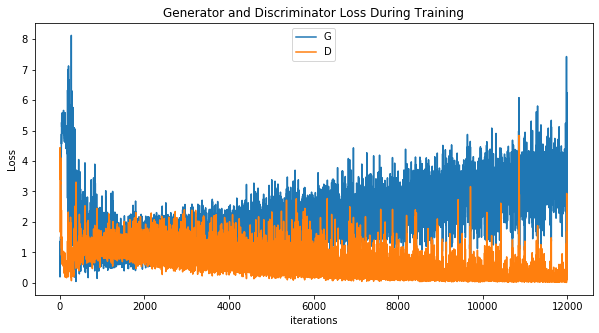

In [32]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

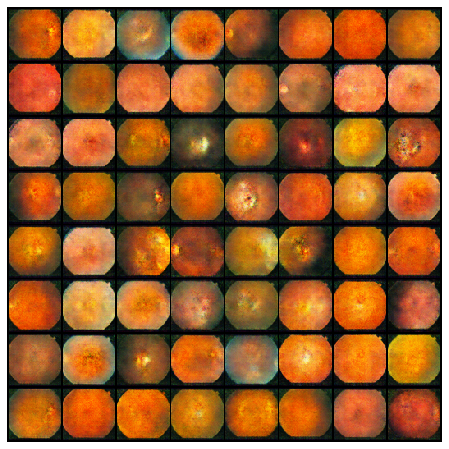

In [33]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
ani.save("anim.mp4")
HTML(ani.to_jshtml())

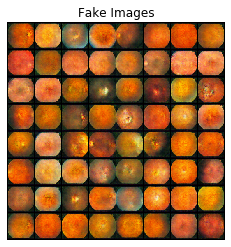

In [34]:

plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.axis('off')
# plt.show()
plt.savefig("new.png",dpi=900)